# Detección de enfermedades en las plantas 

*   Cristian Esneider Parada (Ing. Control)
*   Santiago Ortega Restrepo (Ing. Control)
*   Alejandro Mira Caro (Ing. Control)
*   Mateo Robayo Barrera (Ing. Física)
*   Manuel Mera Mera (Ing. Sistemas)


### Descripción

El sector agrícola enfrenta desafíos significativos relacionados con la producción eficiente y la identificación temprana de enfermedades y cultivos, estos problemas afectan directamente a la productividad y calidad de las plantas, estos desafíos son:



1.   La detección de enfermedades en plantas ha sido un proceso manual y laborioso, sujeto a errores humanos.

2.   La diversidad en las formas, colores, y condiciones ambientales de las plantas añade complejidad al proceso de identificación.

3.   Factores como la iluminación, humedad, y la presencia de objetos cercanos pueden influir en la correcta identificación de una planta o en la detección de enfermedades.


Para abordar estos problemas, buscamos desarrollar una herramienta automatizada que permita identificar enfermedades en plantas mediante técnicas de visión artificial, enfocándose en características específicas como manchas de moho y áreas amarillas en las hojas, que son indicadores de infecciones por hongos. Para poder identificar las enfermedades primero debemos de clasificarlas para entender su funcionalidad y su comportamiento natural, así que para iniciar tomamos como principal muestra de estudio hojas de tomate para realizar el reconocimiento y análisis de enfermedades. 


### Objetivos 

Este proyecto nace de la necesidad de reducir los riesgos para la salud en el ambiente laboral y de optimizar los procesos agrícolas que dependen del ojo humano para identificar problemas en los cultivos, así que nuestros objetivos van encasillados en:

1. Implementar un sistema automatizado de clasificación de hojas con algoritmos de inteligencia artificial y visión artificial.

2. Optimizar el proceso de análisis de cultivos mediante técnicas de procesamiento de imágenes y análisis multiespectral.

3. Mejorar las condiciones laborales al eliminar la exposición a fungicidas y otros productos nocivos para la salud.

4. Automatizar el monitoreo de vegetación y enfermedades en procesos industriales y agrícolas.


### Estado del arte

Con las nuevas tecnologías y herramientas emergentes dentro del procesamiento de imágenes, existe gran variedad de artículos que referencian la detección de múltiples enfermedades en diferentes tipos de plantas con ayuda del procesamiento de imágenes que posteriormente la inteligencia artificial logra realizar la clasificación.

Se han realizado diversos esfuerzos para encontrar métodos que optimicen tanto la fiabilidad como la rapidez del proceso, lo que inevitablemente conlleva algún grado de automatización. La mayoría de los enfoques propuestos hasta el momento se centran en aprovechar tecnologías de procesamiento de imágenes con este fin (Barbedo, 2013). Entre las técnicas de imagen más empleadas destacan la fluorescencia (Bauriegel et al., 2010; Belin et al., 2013; Kuckenberg et al., 2009; Lins et al., 2009; Rodríguez-Moreno et al., 2008), así como el análisis multiespectral e hiperespectral (Barbedo et al., 2015; Mahlein et al., 2012; Oberti et al., 2014; lder et al., 2014; Zhang et al., 2014), y las fotografías convencionales en el espectro visible (Barbedo, 2014; Clément et al., 2015; Kruse et al., 2014; Phadikar et al., 2013; Pourreza et al., 2015; Zhou et al., 2015). Esta última modalidad es la más económica y accesible, ya que el costo de las cámaras digitales sigue disminuyendo, y la mayoría de los dispositivos móviles actuales vienen equipados con cámaras que ofrecen una calidad de imagen aceptable.

Un artículo característico y relevante para la realización de este trabajo es el realizado en (Barbedo, J. G. A., Koenigkan, L. V., & Santos, T. T. (2016)),  donde realizan técnicas de umbralización, transformaciones de color, histogramas de intensidad y un sistema de clasificación por pares. La técnica de umbralización con ayuda de los histogramas y transformación en los canales de color, permiten caracterizar mejor la imagen para identificar las zonas donde se presentan afectaciones en la planta de determinadas plantas, pero primero se debe tener un dataset para el entrenamiento y la prueba del algoritmo.


### Selección de Dataset
En este trabajo, algunas imágenes no fueron creadas por nuestro equipo, sino que provienen del PlantDoc-Dataset, proporcionado por Pratik Kayal a través de GitHub. Este dataset incluye una amplia variedad de plantas, cada una con diferentes características en sus hojas, tanto en forma como en cantidad, aunque mantienen una estructura similar en sus bases.

Se utilizaron 68 imágenes para testeo y 674 imágenes para entrenamiento, todas del conjunto mencionado. A lo largo del proceso de caracterización, uno de los mayores desafíos fue separar las plantas de sus contornos, debido a la similitud de colores entre las hojas y el fondo. Además de estas imágenes, nuestro equipo también generó algunas adicionales y realizó vídeos para demostrar la detección automática de plantas en tiempo real, lo cual complementa el análisis de las imágenes del dataset.

Esta combinación de recursos fue clave para el desarrollo del sistema de visión artificial destinado a la identificación y clasificación automatizada de hojas de plantas.


In [1]:
import functions as f # basic functions from cv course and some by our own...
import os # to access to the images in the dataset
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import rembg # ai background removing tool, not the best really...
import skimage.io
import skimage.data
import skimage.morphology as morph
from skimage.measure import label, regionprops
import csv
import math
import random #to get random pictures


/home/matto/anaconda3/envs/vision/lib/python3.11/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)


Preprocesamiento

Del dataset seleccionado se toman cinco imagenes aleatorias para trabajar.

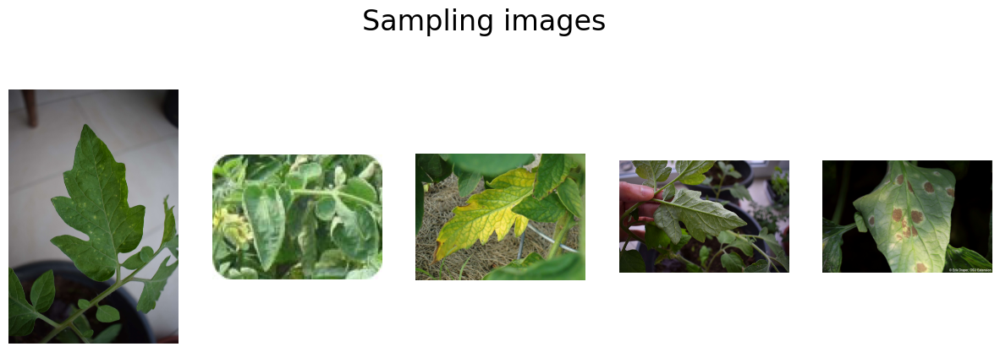

In [47]:
dataSetPath_train = 'PlantDoc-Dataset-master/train/Tomato mold leaf'
dataSetPath_test = 'PlantDoc-Dataset-master/test/Tomato mold leaf' # images here doesn't work...
imagePath_list = [] #to store image paths
images = [] #to store images

imagePaths = os.listdir(dataSetPath_train) #to get the images paths

for n in range(5): #Select 5 random images from the dataset and attach each one to the image path list
    randomInt = imagePaths[random.randrange(0,len(imagePaths)-1,1)]
    imagePath_list.append(randomInt)
for image_path in imagePath_list: # verify if it is a .jpg image and append an RGB version of the image to images list
    if image_path.endswith('.jpg'):
        imgPath = os.path.join(dataSetPath_train,image_path)
        aux = f.im_read(imgPath)
        images.append(aux)

f.plot_multi(images,len(images),Title= 'Sampling images') # show the indexed images


Dado que el proyecto se enfoca en reconocimiento de patrones de enfermedad en plantas, la eliminación del fondo no fue parte escencial del proyecto dado que el fondo que se considera en el analisis es la parte de la hoja que no se encuentra enferma.

Para remover el fondo se recurio a rembg que es una herramienta de remocion de fondos con ai. Usando unicamente esta herramienta se encontró que en algunos casos no reconocia la planta y terminaba elimiando parte de las hojas. Por ello se decidio recurrir a el aislamiento por color usando el espacio de color HSV para tratar de quitar el fondo al escoger y mantener los pixeles que tienen los colores que se encuentran en las hojas (verde, amarillo, naranja) usando valores de Hue, Saturation y Value como threshold.

Para optimizar la remoción del fondo se reduce el brillo en las hojas y se aumenta la saturacion de color para evitar problemas con colores poco saturados (porque tienden a gris) y brillos blancos que se confunden con la gamma de colores del amarillo. La saturación tambien mejora la visibilidad del fondo y el objeto haciendo que la herramienta de remoción de fondos falle menos.

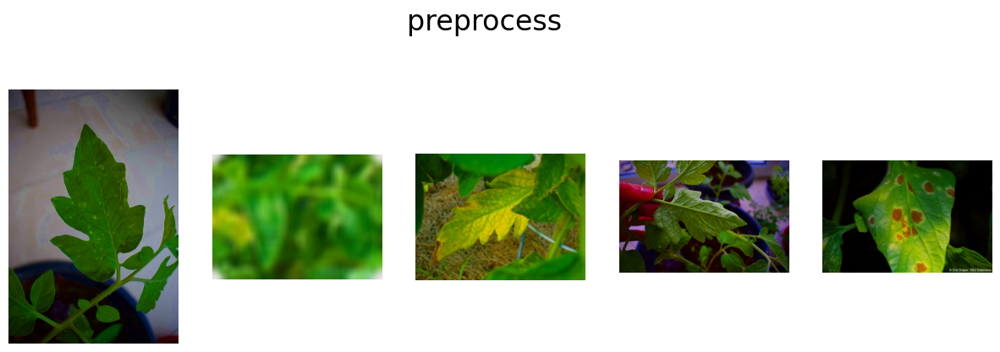

In [48]:
# before removing background we make a little preprocessing
# adjust brightness and saturation to enhance the picture colors
images1 = [f.brightness_correction(image.copy(),level='low',sat=3,val=0.9) for image in images]

preprocess_array = [cv2.GaussianBlur(image,(7,7),5) for image in images1] # some blurring for a better thresholding of the background

f.plot_multi(preprocess_array,5,Title='preprocess')

Se remueve el fondo y se analiza si la imagen resultante tiene más pixeles en negro que en blanco, en este caso se considera que la imagen sin fondo está vacia y se elimina.

Para el metodo por HSV thresholding se crea una copia de la imagen en HSV y se establecen los limites superior e inferior de los tres canales para extraer los colores deseados. Con ello se crea una máscara que en ocaciones incluye parte del fondo y en otras elimina partes enfermas de la hoja. Ver figura 'Only green in pictures'

Para el uso de rembg se seleciona unicamente un canal del rgb que muestra tener mayor variación de color con bordes definidos, este canal es el red, al parecer los canales green y blue tienen una distribución más uniforme en las imagenes reduciendo la probabilidad de exito en la remoción de fondo. Ver figura 'Rembg pictures'

useful_indexes [0, 1, 2, 3, 4]
len of not_background_array 5 
len of main_images 5 



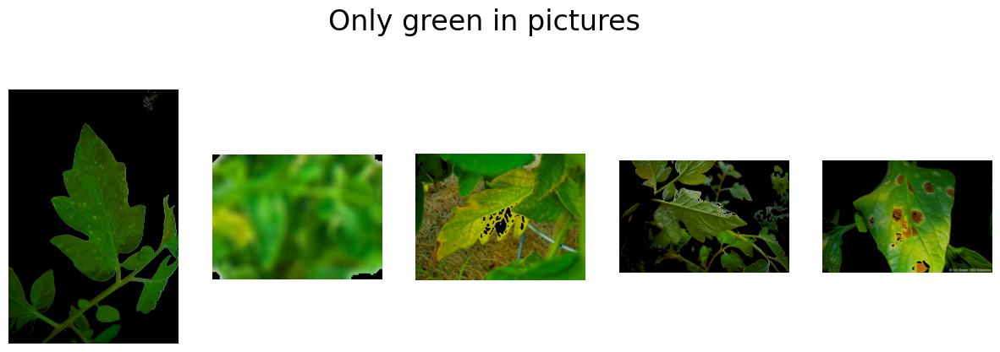

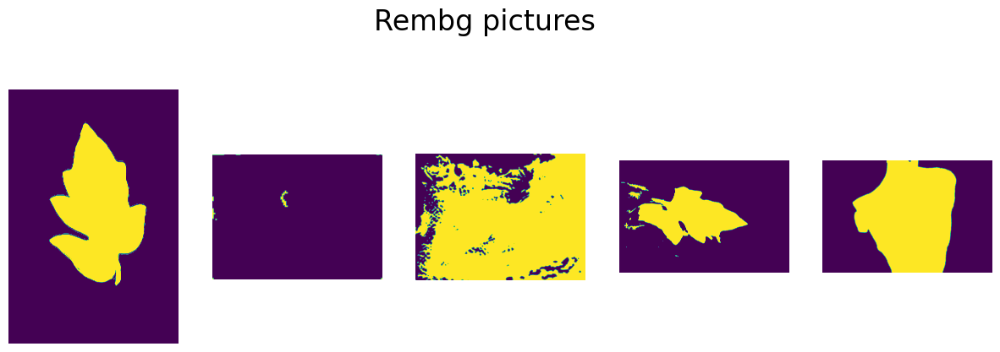

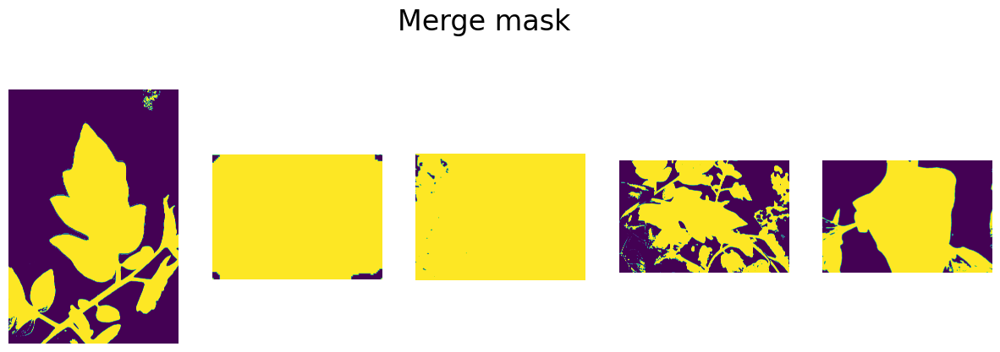

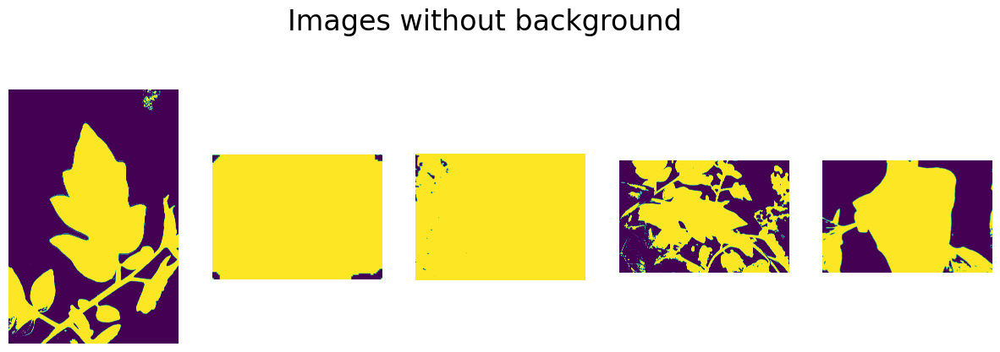

In [49]:
# removing background
# First threshold the images using the green, yellow and orange colors in HSV
green_mask_array = [f.convert_image_f(image.copy(),'hsv') for image in preprocess_array] 

lower_green = np.array([15, 30, 35])    # Lower bound for green (H=250, S=40, V=40) using a wide Hue range in order to include infected areas
upper_green = np.array([96, 255, 200])  # Upper bound for green (H=85, S=255, V=255)

# Create a mask that extracts the selected color
green_mask_array = [cv2.inRange(hsv_image, lower_green, upper_green) for hsv_image in green_mask_array]

# Apply the mask to the original image to get the desired parts
green_extracted = [cv2.bitwise_and(preprocess_array[i], preprocess_array[i], mask=green_mask_array[i]) for i in range(len(preprocess_array))]

if len(green_extracted)>1:
    f.plot_multi(green_extracted,len(green_extracted),Title='Only green in pictures')
else:
    f.show_image(green_extracted[0])

img_green_array = green_mask_array.copy() #store the mask for the merge

# ai rembg takes a lot of time, that is why we try to isolate the leaf(plant) using a color threshold
img_rembg_array = [rembg.remove(image.copy()[:,:,0]) for image in preprocess_array] # using ai rembg tool
img_rembg_array = [f.convert_image_f(image,'gray') for image in img_rembg_array] #this result is not good enough
img_rembg_array = [cv2.threshold(image,1,255,cv2.THRESH_BINARY)[1] for image in img_rembg_array] # convert to binary
if len(img_rembg_array)>1:
    f.plot_multi(img_rembg_array,len(img_rembg_array),Title='Rembg pictures')
else:
    f.show_image(img_rembg_array[0])

# using both methods allows a better isolation 
img_rembg_array = [cv2.bitwise_or(img_green_array[i],img_rembg_array[i]) for i in range(len(preprocess_array))] # merge both background masks


if len(img_rembg_array)>1:
    f.plot_multi(img_rembg_array,len(img_rembg_array),Title='Merge mask')
else:
    f.show_image(img_rembg_array[0])

#if the mean value of the picture is lower than 5 we assume there is no leaf(plant)
# so discard the picture, for safety...
useful_index = []

for i in range(len(img_rembg_array)): # remove not useful images
    if np.mean(img_rembg_array[i].ravel()) > 5:
        useful_index.append(i)

print('useful_indexes',useful_index)
not_background_array = [] # to store all useful masks
main_images = [] #to store all useful preprocessed images to mask later
for n in useful_index: # stores mask and preprocessed images
    not_background_array.append(img_rembg_array[n])
    main_images.append(f.convert_image_f(images[n].copy(), 'rgb'))

print('len of not_background_array',len(not_background_array),'\nlen of main_images', len(main_images),'\n')

if len(main_images)>1:
    f.plot_multi(not_background_array,len(not_background_array),Title='Images without background')
else:
    f.show_image(main_images[0])

Luego de obtener las dos máscaras para la remoción de fondo se selecciona como foreground (es decir la planta) todas las areas en las que HSV threshold o rembg deciden que está presente el objeto a aislar. Solo cuando las máscaras concuerdan que ciertas areas de la imagen corresponden a background (fondo) entonces se selecciona dicha area como fondo. Esto se logra mediante una operación bitwise OR. Ver figura 'Merge mask'

Posteriormente se revisa que la mascara combinada no haya quedado demasiado negra (pixeles en 0) ya que esto significa que no se encontró objeto en la imagen y por tanto se debe descartar. Las imagenes restantes se pueden observar en la figura 'Images without background'

In [50]:
# some morph operation to clear the masks
masks_filled = [cv2.morphologyEx(mask.copy(),cv2.MORPH_OPEN,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5)),iterations=5) for mask in not_background_array]
masks_filled = [cv2.morphologyEx(mask.copy(),cv2.MORPH_CLOSE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5)),iterations=10) for mask in masks_filled]
# to tight the mask
masks_filled = [cv2.morphologyEx(mask.copy(),cv2.MORPH_ERODE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5)),iterations=6) for mask in masks_filled]
# if len(masks_filled)>1:
#     f.plot_multi(masks_filled,len(masks_filled),colorMap='gray', Title='masks filled')
# else:
#     f.show_image(masks_filled[0])

Por medio de operaciones morfológicas se 'suaviza' la máscara y luego se hallan sus contornos para definir las areas que se consideran objeto.

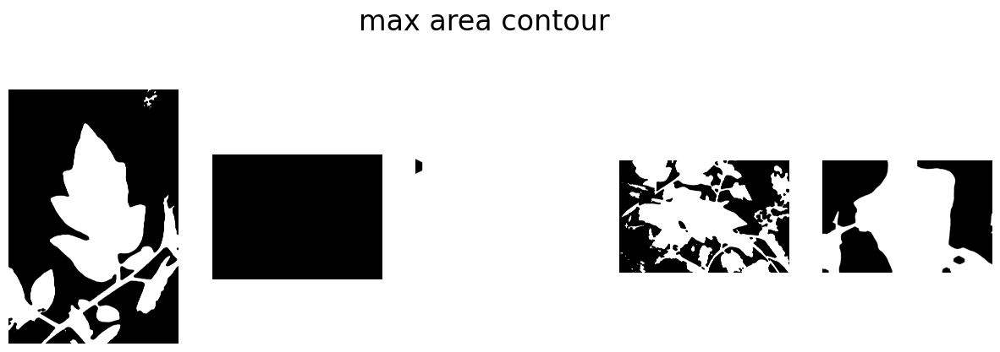

In [51]:
#Crear mascara binaria
main_mask_array = [f.get_contours(image.copy(), np.zeros_like(image),fill=True) for image in masks_filled] # to be sure the mask is enough tight

masks = [element[0] for element in main_mask_array]# extract the mask from the array given by get_contours function, see functions.py
if len(masks)>1:
    f.plot_multi(masks,len(masks), colorMap='gray', Title='max area contour')
else:
    f.show_image(masks[0])

Finalmente se aplica la máscara a la imagen preprocesada para iniciar el análizis. Ver figura 'Masked images'

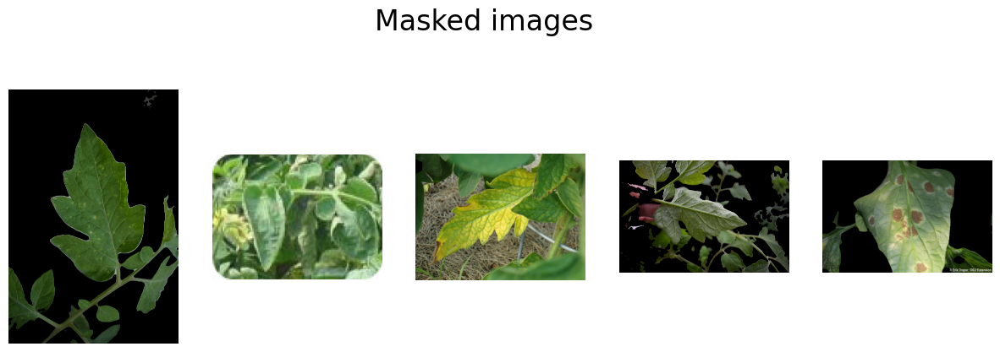

In [52]:
for i in range(len(main_images)): # just to apply each mask to its respective image
    main_images[i][masks[i] == 0] = 0

if len(main_images)>1:
    f.plot_multi(main_images,len(main_images),Title='Masked images')
else:
    f.show_image(main_images[0])

Después de provar distintas transformaciónes en la imagen se encontró que la equalización CLAHE permite resaltar las areas enfermas de la imagen antes de pasar al analisis de canales de espacios de color.

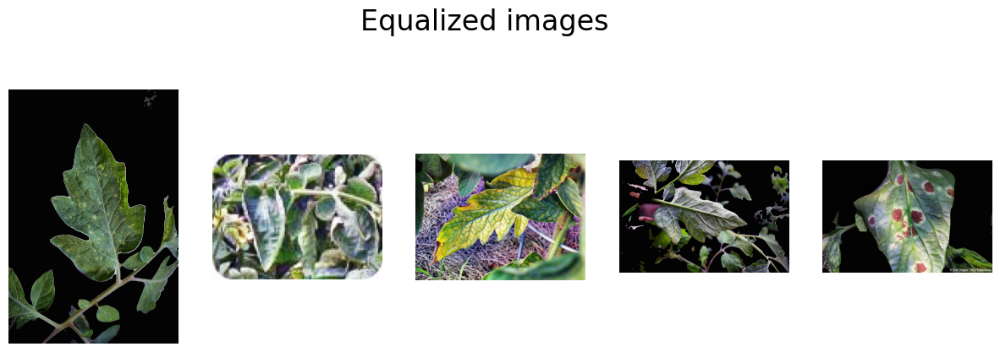

In [53]:
# Here are to many tries to get a useful filtering to process the image in some color space later
# Finally CLAHE (Contrast Limited Adaptive Histogram Equalization) looks good to enhance illness paterns in the leaf(plant)

img_filtered_array = [f.clahe_f(image, a=2, x=5,y=5) for image in main_images]

if len(img_filtered_array)>1:
    f.plot_multi(img_filtered_array,len(img_filtered_array), Title='Equalized images')
else:
    f.show_image(img_filtered_array[0])

# plt.imshow(img_eq_array[2])

# for image_eq in img_eq_array:
#     f.showHistogramColor_f(image_eq)

Selección de espacios de color

In [233]:
sample_index = 0 # choose ramdomly one picture to analyze
if len(img_filtered_array)>1:
    sample_index = random.randrange(0,len(img_filtered_array),1)
print('sample_index:',sample_index)
# sample_index = 4

sample_index: 4


Aleatoriamente se escoge una imagen de las cinco indexadas al inicio y se muestran los canales de distintos espacios de color para identificar los canales donde las regiones de interés se hacen más oscuras o brillantes facilitando la segmentación. Haciendo este análisis para varias imagenes se encuentra que los espacios LAB, HSV y HLS muestran más comunmente las zonas de interés aunque a veces por cuestiones de brillo y saturación se pueden perder algunos detalles. 

Los canales escogidos fueron el Light del LAB para detectar las areas amarillentas (blancas si el hongo está en la superficie) dado que no se satura tanto como el L o V de los espacios de color HLS y HSV.

Para detectar las manchas (spots) se uso el canal Hue del espacio HLS. Con este canal se segmentan los colores rojos con distintos niveles de saturación y aun corresponde la mayoria de las veces a las manchas.

Otros canales no aislan las regiones de interés o ni si quiera las muestran. Otros espacios que podrían servir para la segmentación son YUV y YcRcB.

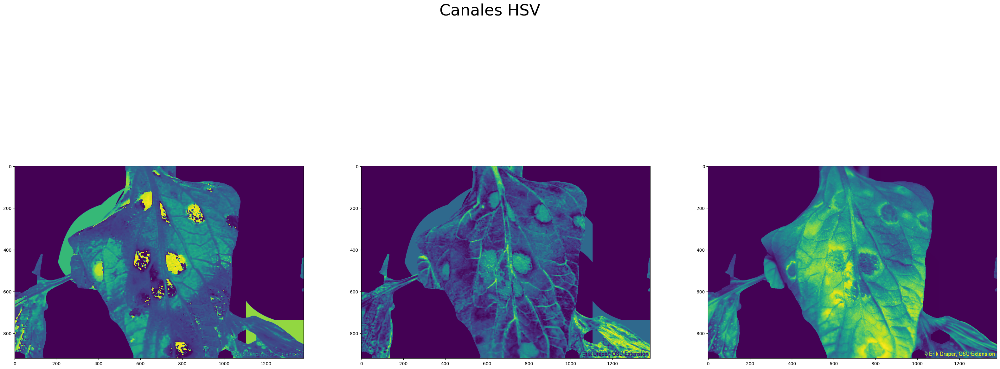

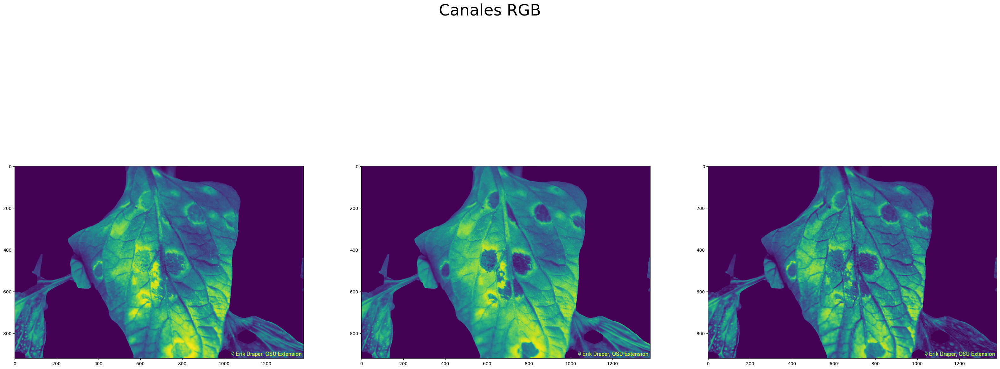

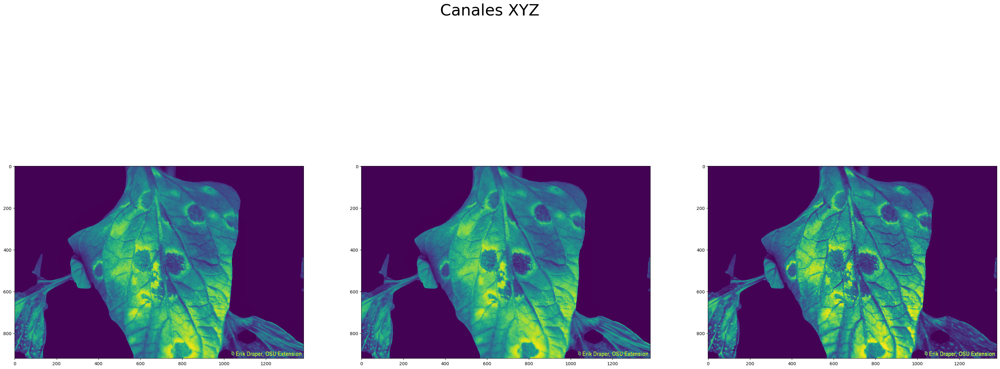

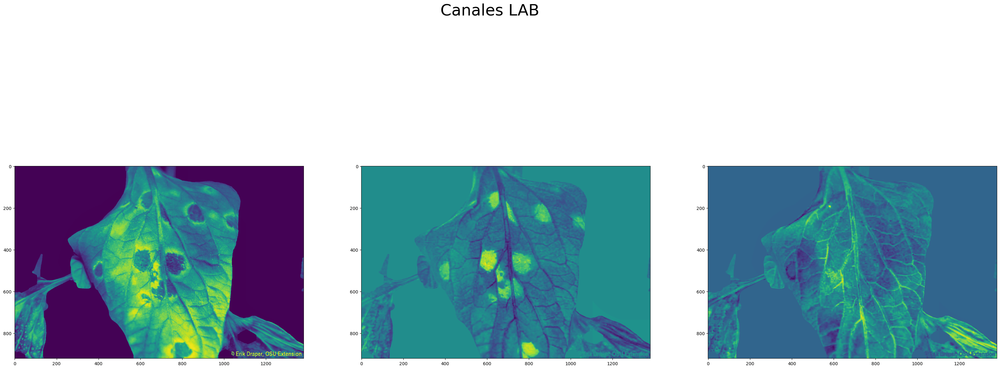

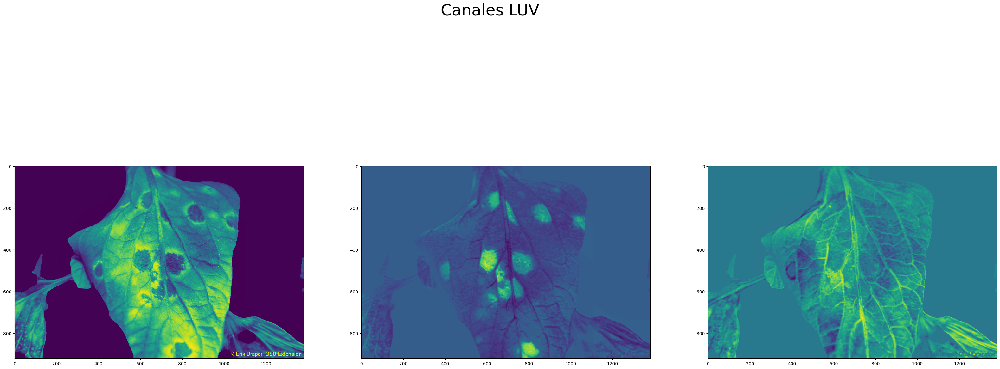

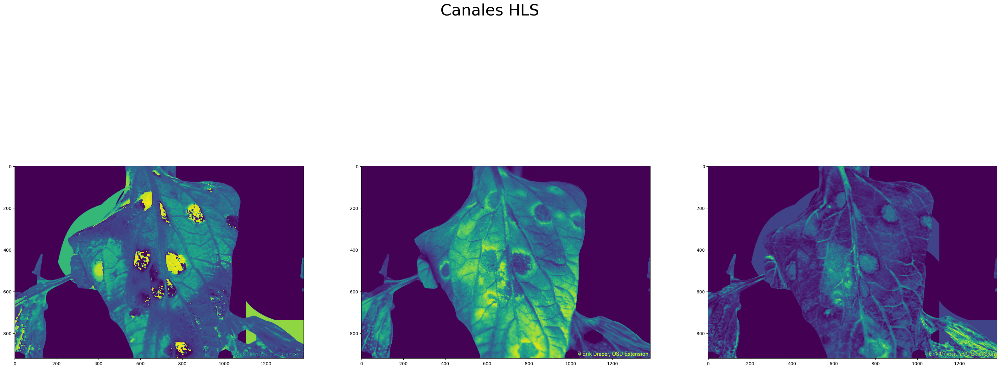

In [234]:
colors = ['HSV','RGB', 'XYZ', 'LAB', 'LUV', 'HLS']
# colors = ['HLS','HSV']

for i in colors: # shows the three channels of each color space in colors list
    f.showColorSpace(img_filtered_array[sample_index], i)


### Análisis espacios de color

El proceso comienza con la lectura de las imágenes y su visualización en diferentes espacios de color, lo que nos permite explorar visualmente cuál es el más adecuado para analizarlas. Los espacios de color seleccionados incluyen HSV, RGB, LAB, XYZ, HLS, YCRCB,LUV y YUV. Al descomponer las imágenes en sus componentes en cada uno de estos espacios, podemos entender mejor cómo se representa la información de color.

Este análisis de los espacios de color es crucial para la detección de enfermedades en hojas de plantas, ya que necesitamos identificar manchas marrones-rojas y áreas amarillas, que son indicativos de enfermedades en la hoja de la planta.

Después de una evaluación visual de los espacios de color, se seleccionan dos espacios que permiten extraer la información de manera más efectiva: HLS y LAB.

* HLS: Este espacio es útil para detectar las manchas marrones-rojas, utilizando el canal de matiz (Hue), ya que permite separar con precisión las regiones rojizas asociadas con la enfermedad. 
* LAB: Este espacio de color es eficaz para detectar las áreas amarillas, utilizando el canal de luminancia (Lightness) para captar las zonas más claras de la hoja, donde se pueden manifestar signos de enfermedad.

El código continúa refinando las máscaras generadas para eliminar el ruido y mejorar la precisión de las áreas afectadas. Se aplican técnicas morfológicas para definir mejor las regiones detectadas, y finalmente se crea una máscara que resalta tanto las manchas marrones-rojas como las áreas amarillas, lo que permite segmentar y detectar con precisión los síntomas visibles de la enfermedad en la hoja.


### Métricas 

| Canales            | Identificación                                                                                              | Ventajas                                                                                                                                           | Desventajas                                                                                                                                  | Análisis                                                                                                               |
|--------------------|------------------------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------------------------------------------------|------------------------------------------------------------------------------------------------------------------------|
| [RGB] Canal R      | Nos puede servir para detectar las manchas marrones-roja.                                                   | Sirve para detectar los lugares con posible enfermedad, ya que las manchas tienden a resaltar en tonos rojizos.                                      | Poca diferencia entre las plantas sanas y el entorno, a menos que las manchas sean muy pronunciadas.                                          | Funciona bien para identificar manchas rojas o marrones, pero no es muy eficiente en otros tipos de enfermedad.        |
| [RGB] Canal G      | Permite la diferenciación de áreas verdes (sanas) con áreas infectadas que presentan otros colores.          | Es útil para identificar áreas verdes sanas.                                                                                                        | No es eficaz para identificar áreas no verdes o afectadas, ya que no resalta adecuadamente las zonas enfermas.                               | Se puede utilizar como referencia para plantas sanas, pero requiere combinarse con otros canales para detectar enfermedades. |
| [RGB] Canal B      | No tiene mucha utilidad para detectar enfermedades en plantas.                                              | No ofrece ventaja relevante.                                                                                                                        | No resalta las áreas afectadas ni diferencia bien las plantas sanas.                                                                         | Descartado para la identificación de enfermedades.                                                                    |
| [LAB] Canal Luminosidad | Distingue entre diferentes niveles de brillo, lo que puede ayudar a identificar áreas afectadas.         | Diferencia zonas con distinta intensidad de luz o sombra.                                                                                           | La detección es muy dependiente de las condiciones de luz, lo que puede generar resultados inconsistentes.                                    | Útil para diferenciar áreas afectadas en entornos controlados de luz, pero puede ser poco fiable en entornos naturales. |
| [LAB] Canal A*     | Separa los tonos entre verde y rojo. Las áreas afectadas podrían diferenciarse si cambian a un tono más rojizo o amarillento. | Diferencia clara entre el verde (sano) y los tonos rojizos o amarillos (posibles áreas afectadas).                                                   | Puede no ser efectivo en algunas plantas si el cambio de color no es lo suficientemente marcado.                                             | Puede ser útil para detectar enfermedades que afecten el color de la hoja, especialmente en la gama de rojos y verdes.  |
| [LAB] Canal B*     | Diferencia tonos azules y amarillos.                                                                        | Puede ayudar a identificar zonas de la hoja que se vuelven más amarillas con la enfermedad.                                                          | Poca utilidad en plantas que no cambian de color hacia amarillo o azul cuando están enfermas.                                                | Útil en algunos casos específicos donde la enfermedad afecta el tono amarillo, pero no siempre aplicable.              |
| [XYZ] Canal X,Y,Z  | No hay una distinción clara entre zonas sanas y enfermas en este espacio de color para plantas.              | Ninguna ventaja relevante para este caso.                                                                                                           | No permite identificar claramente las zonas afectadas.                                                                                       | No se recomienda usar este canal para la identificación de enfermedades en hojas.                                      |
| [HSV] Canal H      | Diferencia clara de matices. Las áreas afectadas suelen mostrar un cambio de tonalidad significativo.        | Resalta bien las diferencias de color entre áreas afectadas y sanas.                                                                                 | Puede fallar si la enfermedad no produce un cambio notable de color.                                                                         | Es útil para enfermedades que alteran los colores naturales de la hoja, resaltando diferencias de tonalidad.           |
| [HSV] Canal S      | Detecta cambios en la saturación del color, lo que puede indicar áreas afectadas con menos saturación.       | Diferencia notable entre las zonas afectadas y no afectadas por cambios de saturación.                                                               | No siempre las áreas afectadas cambian su saturación de manera predecible.                                                                  | Es útil en combinación con otros canales para identificar áreas donde la saturación del color se ve afectada.           |
| [HSV] Canal V      | Mide la intensidad del color, lo que podría resaltar áreas afectadas que tienen una intensidad diferente.    | Permite ver variaciones en la intensidad que pueden correlacionarse con enfermedades.                                                               | Dependiente de las condiciones de iluminación, lo que podría llevar a falsos positivos.                                                      | Puede ser útil para detectar cambios de intensidad en la planta, pero la iluminación juega un papel importante en su eficacia. |
| [LUV] Canal L      | Representa la luminosidad, similar al canal Y o al canal de luminosidad en LAB.                             | Identifica variaciones de brillo en la planta.                                                                                                      | Muy dependiente de la iluminación externa.                                                                                                   | Puede ayudar a detectar áreas afectadas si la intensidad de la luz varía en las hojas.                                |
| [LUV] Canal U      | Distingue entre tonos verde y magenta, lo que puede resaltar cambios de color en plantas enfermas.           | Buena diferenciación entre áreas afectadas y sanas si hay cambio de tonalidad.                                                                       | Ineficaz en plantas sin cambio de color.                                                                                                      | Útil en casos específicos de cambio de color hacia magenta o verde, pero no siempre es aplicable.                      |
| [LUV] Canal V      | Distingue entre tonos amarillos y azules, similar al canal B* de LAB.                                       | Puede detectar zonas amarillentas por enfermedad.                                                                                                   | Limitado a plantas que presenten cambios hacia amarillo.                                                                                     | Puede ser útil si la enfermedad produce tonalidades amarillas, aunque no es siempre eficiente.                         |
| [HLS] Canal H      | Similar al canal H de HSV, diferenciando entre tonos de color.                                              | Útil para detectar cambios de color por enfermedad.                                                                                                 | Menos eficaz si no hay un cambio de color evidente.                                                                                           | Buen canal para detectar cambios de color, pero debe combinarse con otros si la enfermedad no produce un cambio tonal claro. |
| [HLS] Canal L      | Detecta variaciones en la luminosidad o brillo, útil para distinguir áreas afectadas con menor intensidad de luz. | Diferencia en intensidad lumínica.                                                                                                                   | Dependiente de las condiciones de luz externa, lo que puede complicar la detección.                                                           | Funciona bien en condiciones controladas de luz, pero puede dar resultados inconsistentes en exteriores.               |
| [HLS] Canal S      | Similar al canal S de HSV, mide la saturación del color, lo que puede destacar áreas enfermas con menor saturación. | Útil para detectar cambios de saturación en áreas afectadas.                                                                                          | No siempre las áreas afectadas presentan cambios claros de saturación.                                                                       | Funciona bien en combinación con otros canales para detectar áreas con menor saturación, pero no siempre es suficiente por sí solo. |


#### Canal H del espacio HSV

* Diferenciación de Tonalidades: A diferencia de los canales RGB, que pueden ser menos efectivos para detectar cambios sutiles en color, el canal H se centra específicamente en el matiz, permitiendo una identificación clara de alteraciones en la coloración de las hojas.

* Mayor Sensibilidad a Cambios Patológicos: Este canal es particularmente útil para detectar enfermedades que provocan cambios visibles en el color, como el amarillamiento o el enrojecimiento, aspectos que pueden ser menos evidentes en otros espacios de color.

* Resiliencia ante el Ruido: A diferencia del canal B de RGB, que no resalta bien las áreas afectadas, el canal H puede ofrecer una representación más clara y menos afectada por el ruido ambiental, facilitando la identificación de problemas.

#### Canal L del espacio LAB
* Medición de Luminosidad: Este canal proporciona información sobre la luminosidad de las hojas, algo que otros canales, como los de RGB, no hacen de manera efectiva. La luminosidad puede ser un indicador clave de salud de la planta, ayudando a identificar áreas que podrían estar sufriendo debido a enfermedades.

* Diferenciación en Condiciones de Luz Variadas: Aunque es dependiente de la iluminación, el canal L puede ayudar a diferenciar áreas afectadas en condiciones controladas, lo que es útil para estudios en invernaderos o entornos similares.

* Combinación Eficaz: Cuando se combina con el canal H, permite un análisis más completo de las hojas al considerar tanto el color como la intensidad de luz, superando las limitaciones de otros canales, como el canal G de RGB, que puede no ser efectivo para detectar áreas enfermas que no son verdes.

#### Comparación con Otros Canales
* RGB: Aunque los canales R, G y B pueden ser útiles, a menudo no captan bien los cambios sutiles en el color y no son tan efectivos para identificar áreas afectadas, especialmente en el caso de plantas que presentan síntomas no obvios.

* XYZ y YUV: Estos espacios no ofrecen distinciones claras entre zonas sanas y enfermas, lo que los hace menos útiles en este contexto.

* Otros Canales de LAB y HSV: Aunque los otros canales (A*, B*, S, V) pueden tener su utilidad, el canal H y el canal L son más integrales para el diagnóstico de enfermedades, ya que combinan información sobre color y luminosidad de manera efectiva.

En resumen, la elección del canal H del espacio HSV y el canal L del espacio LAB proporciona una combinación efectiva y específica para la detección de enfermedades en hojas, resaltando los cambios de color y brillo que son críticos para el diagnóstico efectivo.


Después de escogidos los canales a implementar en la segmentación. Se creó una funcion de segmentación que retorna mascaras para la region de interés (hoja-planta), las zonas con manchas (spots) y las areás amarillas (yellows).
 En el siguiente bloque de codigo se define y explica la funcion de segmentación. Ver resultados en 'Paterns masks'

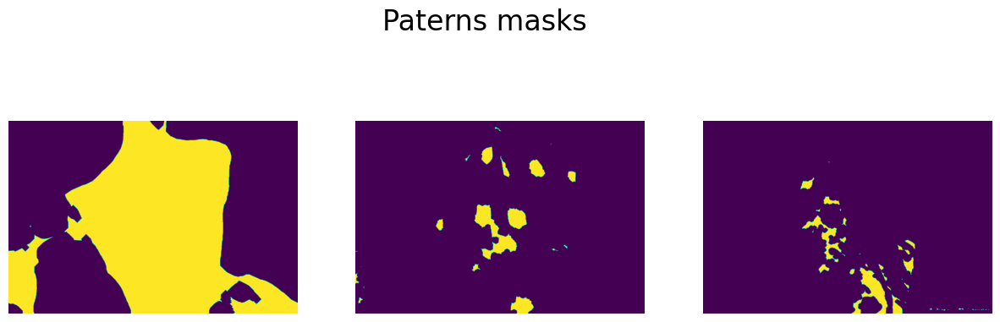

In [235]:
def segmentation_f(img_not_bg): # this function fetch for spot(brown-red) and yellow areas(yellow to orange) in the leaf(plant)
    size_kernel = 5
    aux_img = None
    tomato_mold_leaf_HLS = f.convert_image_f(img_not_bg, 'HLS')#HLS shows to be good to catch red-brown regions using Hue channel
    tomato_mold_leaf_LAB = f.convert_image_f(img_not_bg, 'LAB')#LAB Light channel works well catching the yellow areas

    img_spots = cv2.GaussianBlur(tomato_mold_leaf_HLS,(size_kernel,size_kernel),0)[:,:,0]#Hue channel
    # f.show_image (img_not_bg)
    img_yellow = tomato_mold_leaf_LAB[:,:,0] # Light channel
    
    _,mask = cv2.threshold(tomato_mold_leaf_LAB[:,:,0],20,255,cv2.THRESH_BINARY) # to establish an area in the image to work with
    # f.show_image(mask)
    # Refine mask with morph operations
    mask = cv2.morphologyEx(mask,cv2.MORPH_DILATE,cv2.getStructuringElement(cv2.MORPH_CROSS,(size_kernel+4,size_kernel+4)),iterations=1)
    mask = cv2.morphologyEx(mask,cv2.MORPH_ERODE,cv2.getStructuringElement(cv2.MORPH_CROSS,(size_kernel+4,size_kernel+4)),iterations=5)
    
    # red color in Hue are between -25(225) to 25 aprox that give us the brown areas to (by saturation on red color)
    aux_img = img_spots.copy()
    img_spots[img_spots > 250] = 128 # to avoid some pure red colors
    aux_img[img_spots<20] = 255 # dark areas in hue
    aux_img[mask==0] = 0
    # f.show_image(aux_img)
    img_spots[img_spots>155] = 255 # light areas in hue
    img_spots[mask == 0] = 0 # remove adquired areas out of mask region
    img_yellow[img_yellow > 200] = 255 # light areas commonly are yellow areas (bright areas are included, that's why brightness was reduced before)
    img_yellow[mask == 0] = 0 # keep only the yellow areas in the mask region
    
    # f.show_image(mask)
    # f.show_image(img_spots)
    # f.show_image(img_yellow)

    # include a few more pixels and convert to binary
    _,output_aux_spots = cv2.threshold(aux_img,240,255,cv2.THRESH_BINARY)
    # f.show_image(output_aux_spots)
    _,output_spots = cv2.threshold(img_spots,240,255,cv2.THRESH_BINARY)
    # f.show_image(output_spots)
    output_spots = cv2.bitwise_or(output_spots,output_aux_spots) # merge spots over 250 and under 20 in hue

    _,output_yellow = cv2.threshold(img_yellow,250,255,cv2.THRESH_BINARY) #Yellow areas
    # f.show_image(output_spots)
    # f.show_image(output_yellow)
    # enhance yellow and spots by clear the dust and joint the bigger areas, maybe works well before the mask... or after it?
    output_yellow = cv2.morphologyEx(output_yellow,cv2.MORPH_CLOSE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel-2,size_kernel-2)),iterations=4)
    output_yellow = cv2.morphologyEx(output_yellow,cv2.MORPH_OPEN,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel,size_kernel)),iterations=2)
    output_yellow = cv2.morphologyEx(output_yellow,cv2.MORPH_ERODE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel,size_kernel)),iterations=3)
    
    output_spots = cv2.morphologyEx(output_spots,cv2.MORPH_OPEN,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel-2,size_kernel-2)),iterations=1)
    output_spots = cv2.morphologyEx(output_spots,cv2.MORPH_CLOSE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel,size_kernel)),iterations=5)
    output_spots = cv2.morphologyEx(output_spots,cv2.MORPH_ERODE,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(size_kernel-2,size_kernel-2)),iterations=2)

    output_spots = cv2.bitwise_and(output_spots,mask) # to be sure the added pixels are inside the mask region
    output_yellow = cv2.bitwise_and(output_yellow,mask)

    
    # f.show_image(output_spots)
    # f.show_image(output_yellow)

    return [output_spots,output_yellow, mask] # return spots mask, yellow mask and leaf(plant) mask

img_spots,img_yellow, mask = segmentation_f(img_filtered_array[sample_index])

f.plot_multi([mask,img_spots,img_yellow],3,Title='Paterns masks')

Con las máscaras se pueden identificar las manchas y areas amarillas que identifican a la enfermedad.

Ahora podemos contar las manchas y calcular el área amarilla en la muestra para conocer el avance de la enfermedad. En el siguiente bloque de codigo se explica como se realizan los cálculos. Cabe resaltar que algunos puntos de la mascara de manchas no se cuentan, bien porque son muy pequeños o porque son demasiado grandes, si son demasiado grandes es porque probablemente parte del fondo sigue en la imagen.

Number of spots in the leaf:  11
Yellow percentage: 9.40%


Text(0.5, 1.0, 'Mold yellow area')

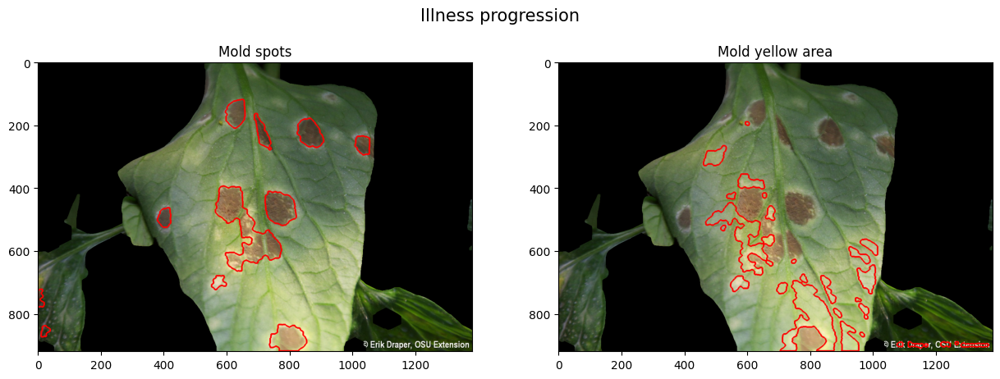

In [236]:
# to count spots and calculate yellow area
# get_contours functions returns [image masked picture, dict contour_areas, list contours] 
m_spots,spots, contours_spot = f.get_contours(img_spots,main_images[sample_index]) # mask original image with spots mask
m_yellow,yellows, contours_yellow = f.get_contours(img_yellow, main_images[sample_index]) # mask original image with yellow mask
m_mask,mask_area, contours_mask = f.get_contours(mask,np.zeros_like(mask),fill=True) # returns the leaf mask
# f.show_image(m_mask)

#to calculate leaf area
leaf_area = 0.0
for i in range(len(mask_area)): # add each area in mask_area to leaf_area to get the overall area analyzed
    leaf_area += mask_area[i]

sum_yellows = 0.0
for i in range(len(yellows)): # add each area in yellows to sum_yellows to get the overall yellow area in the leaf(plant)
    sum_yellows += yellows[i]
# print('Yellow area:',sum)

#to count sports
# print('spots_dic',spots)
# print('contours_spot', contours_spot[1])
aux_spots = [(spots[spot]/leaf_area)*100 for spot in spots] # spot_area/leaf_area in percentage, to threshold spots later
# print('aux_spots',aux_spots)
# print('max spot', np.max(aux_spots))

#add if area of the spots are lower than some % of leaf area, dont count as spot (solved)

spots_to_draw = []
for i in range(len(spots)): # selects spots with a visible area and an area lower than 40% of the plant region
    if aux_spots[i] > 0.1 and aux_spots[i] < 40.0:
        spots_to_draw.append(contours_spot[i])

# print('spots_to_draw',spots_to_draw)
m_spots = cv2.drawContours(main_images[sample_index].copy(),spots_to_draw,-1,(255,0,0),3) # redraw spots in the picture cause they were filtered

number_of_spots = len(spots_to_draw)


print('Number of spots in the leaf: ', number_of_spots)
print('Yellow percentage: %2.2f%%' %((sum_yellows/leaf_area)*100))

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15, 6))
fig.suptitle(f"Illness progression", fontsize=15, y=0.9)
ax1.imshow(m_spots)
ax2.imshow(m_yellow)

ax1.set_title('Mold spots')
ax2.set_title('Mold yellow area')

# data.append([image_path,number_of_spots,((sum/leaf_area)*100)]) # the .csv is used in the leaf_illness_analyzer.ipynb file 

Con un mejor aislamiento de la hoja en la planta la certeza en la identificación de la enfermedad sería mucho mayor y por tanto tendriamos un resultado altamente confiable.

#### Ahora podemos aislar las zonas de interés para hacer una extración de caracteristicas

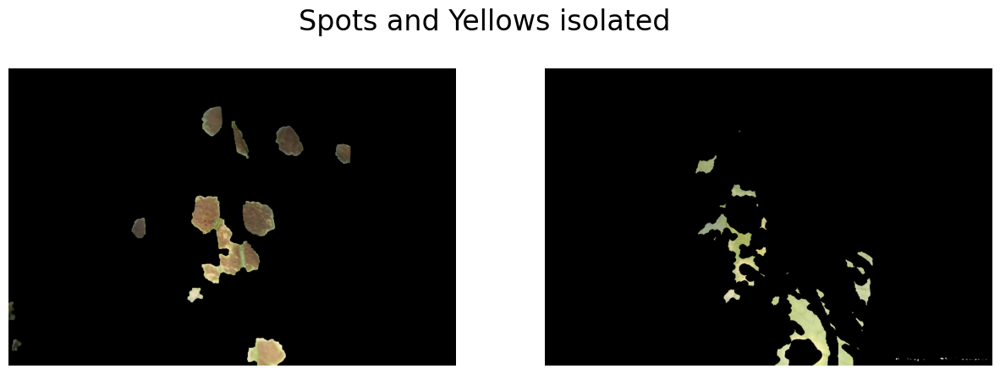

In [237]:
# this section is for isolate the spots and yellows for future characteristic extraction and neural network trianing
mask_spots = cv2.drawContours(np.zeros_like(images[sample_index]),spots_to_draw,-1,(255,0,0),-1)
mask_spots = f.convert_image_f(mask_spots,'gray')
# f.show_image(mask_spots)
leaf_spots = images[sample_index].copy()
leaf_yellows = images[sample_index].copy()

leaf_spots[mask_spots == 0] = 0
leaf_yellows[img_yellow == 0] = 0

f.plot_multi([leaf_spots,leaf_yellows],2,Title='Spots and Yellows isolated')


Con los puntos y areas amarillas de la planta se puede identificar moho en plantas, en este caso fueron muestras de hojas de tomate. Posteriormente se espera que con un algoritmo de reconocimiento de plantas y otro de hojas en plantas se pueda usar este proyecto para entrenar redes neuronales en pro de identificar enfermedades especificas en plantas ya sea en cultivo o en investigación de cultivos bajo condiciones controladas.

### Conclusiones y resultados 

El proyecto desarrolló con éxito un sistema de identificación de enfermedades en plantas, específicamente enfocado en el moho en hojas de tomate, utilizando técnicas de visión artificial para detectar áreas amarillentas y manchas de moho en las hojas. Este enfoque busca eliminar la necesidad de inspección manual y reducir el error humano inherente a los métodos convencionales de detección.

La investigación determinó que los espacios de color más óptimos para identificar las áreas amarillas y las manchas de moho fueron HSV y LAB, probablemente debido a la clara diferencia en la coloración de las zonas afectadas. Las técnicas de segmentación y generación de máscaras permitieron aislar con precisión las áreas enfermas de las plantas, facilitando el entrenamiento de redes neuronales para su posterior implementación.

La automatización en el reconocimiento de enfermedades optimiza el proceso de análisis en cultivos, ofreciendo resultados rápidos y confiables en el monitoreo y la detección de patologías. Este proyecto tiene el potencial de servir como base para futuros desarrollos en la detección de enfermedades, con posibles aplicaciones en otros cultivos. El sistema podría convertirse en una herramienta valiosa tanto para la agricultura a nivel industrial como para entornos de investigación controlada.

### Referencias 

* Barbedo, J. G. A., Koenigkan, L. V., & Santos, T. T. (2016). Identifying multiple plant diseases using digital image processing. Biosystems engineering, 147, 104-116.

* Barbedo, J. G. A. (2013). Digital image processing techniques for detecting, quantifying and classifying plant diseases. SpringerPlus, 2(660).

* Barbedo, J. G. A. (2014). An automatic method to detect and measure leaf disease symptoms using digital image processing. Plant Disease, 98, 1709e1716.

* Barbedo, J. G. A., Tibola, C. S., & Fernandes, J. M. C. (2015). Detecting Fusarium head blight in wheat kernels using hyperspectral imaging. Biosystems Engineering, 131, 65e76.

* Bauriegel, E., Giebel, A., & Herppich, W. B. (2010). Rapid Fusarium head blight detection on winter wheat ears using chlorophyll f luorescence imaging. Journal of Applied Botany and Food Quality, 83(2), 196e203.

* Kruse, O. M. O., Prats-Montalban, J. M., Indahl, U. G., Kvaal, K., Ferrer, A., & Futsaether, C. M. (2014). Pixel classification methods for identifying and quantifying leaf surface injury from digital images. Computers and Electronics in Agriculture, 108, 155e165.

* Kuckenberg, J., Tartachnyk, I., & Noga, G. (2009). Detection and differentiation of nitrogen-deficiency, powdery mildew and leaf rust atwheatleafandcanopylevelbylaser-inducedchlorophyll f luorescence. Biosystems Engineering, 103(2), 121e128.

* Mahlein, A. K., Steiner, U., Hillnhu¨tter, C., Dehne, H. W., & Oerke, E. C. (2012). Hyperspectral imaging for small-scale analysis of symptoms caused by different sugar beet diseases. Plant methods, 8(1), 3.

* Oberti, R., Marchi, M., Tirelli, P., Calcante, A., Iriti, M., & Borghese, A. N. (2014). Automatic detection of powdery mildew on grapevine leaves by image analysis: optimal viewangle range to increase the sensitivity. Computers and Electronics in Agriculture, 104,1e8.

* Phadikar, S., Sil, J., & Das, A. K. (2013). Rice diseases classification using feature selection and rule generation techniques. Computers and Electronics in Agriculture, 90,76e85.

* Pourreza, A., Lee, W. S., Etxeberria, E., & Banerjee, A. (2015). An evaluation of a vision-based sensor performance in Huanglongbing disease identification. Biosystems Engineering, 130,13e22.

* Rodríguez-Moreno, L., Pineda, M., Soukupova, J., Macho, A. P., Beuzon, C. R., Baron, M., et al. (2008). Early detection of bean infection by Pseudomonas syringae in asymptomatic leaf areas using chlorophyll fluorescence imaging. Photosynthesis Research, 96,27e35.

* Zhang, J., Yuan, L., Pu, R., Loraamm, R. W., Yang, G., & Wang, J. (2014). Comparison between wavelet spectral features and conventional spectral features in detecting yellow rust for winter wheat. Computers and Electronics in Agriculture, 100, 79e87.

* Zhou, R., Kaneko, S., Tanaka, F., Kayamori, M., & Shimizu, M. (2015). Image-based field monitoring of Cercospora leaf spot in sugar beet by robust template matching and pattern recognition. Computers and Electronics in Agriculture, 116, 65e79.
